<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/Magnus_Carlsen_Chess_com_games_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Magnus Carlsen Chess.com games Dataset


# About the Dataset & Insights

This dataset comprises 6699 games played by Magnus Carlsen on Chess.com, detailed across 13 distinct features. The dataset provides a rich historical record of his online performance, spanning from 2014 to 2026 (though the future dates might indicate data collection or simulation anomalies). Each entry includes game specifics such as player_name (consistently 'Magnus Carlsen'), opponent_name, player_rating, opponent_rating, format (Blitz or Rapid), date, year, result (Win, Loss, Draw), player_color, opponent_color, result_raw, and the sequence of moves.

Initial inspection reveals the dataset is largely clean, with no duplicate entries. Only 4 entries have missing values in the moves column, which is a minor fraction and doesn't significantly impede overall analysis. The majority of games fall under the Blitz format (around 95%), indicating Magnus Carlsen's preference for faster time controls on the platform. His player_rating generally fluctuates around a high average of 3223, while opponent_rating averages 2962, showcasing a consistent challenge against strong players.

Key insights from the analysis highlight Magnus Carlsen's dominant performance, with a 71% overall win rate, 19% losses, and 10% draws. This distribution varies by game format: his win rate is higher in Blitz (71.8%) compared to Rapid (53.7%), while Rapid games have a significantly higher proportion of draws (26.8%). Furthermore, playing as White (73.9% win rate) yields a higher chance of winning for Carlsen than playing as Black (68.0% win rate). The Win/Loss/Draw Trend Over Years shows fluctuations but generally a strong win rate across the observed years, with some years exhibiting exceptional performance. A heatmap revealed a strong positive correlation between player_rating and opponent_rating, suggesting Carlsen frequently plays against highly-rated opponents, which aligns with his status as a top player.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d dhrubangtalukdar/magnus-carlsen-chess-com-games

# Unziping the downloaded file
!unzip magnus-carlsen-chess-com-games.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/dhrubangtalukdar/magnus-carlsen-chess-com-games
License(s): MIT
  0% 0.00/1.46M [00:00<?, ?B/s]
100% 1.46M/1.46M [00:00<00:00, 839MB/s]
Archive:  magnus-carlsen-chess-com-games.zip
  inflating: magnus_carlsen_games.csv  


In [3]:
df = pd.read_csv('magnus_carlsen_games.csv')
df.head(11)

,id,player_name,opponent_name,player_rating,opponent_rating,format,date,year,result,player_color,opponent_color,result_raw,moves
0,0,Magnus Carlsen,RainnWilson,2862,1200,Rapid,2014-12-14,2014,Win,white,black,1-0,1. e4 g6 2. Nf3 d6 3. d4 Bg7 4. Bc4 Bg4 5. Bxf...
1,1,Magnus Carlsen,solskytz,2862,1702,Rapid,2014-12-14,2014,Win,white,black,1-0,1. d4 Nf6 2. c4 e6 3. Nc3 Bb4 4. e3 c5 5. Ne2 ...
2,2,Magnus Carlsen,Tildenbeatsu,2862,1200,Rapid,2014-12-14,2014,Win,white,black,1-0,1. e4 e5 2. Nf3 Nc6 3. Bb5 Nf6 4. O-O Nxe4 5. ...
3,3,Magnus Carlsen,mtmnfy,2862,1200,Rapid,2014-12-14,2014,Win,white,black,1-0,1. d4 e6 2. e4 d5 3. Nd2 Nc6 4. Ngf3 Nf6 5. e5...
4,4,Magnus Carlsen,stepanosinovsky,2862,2360,Rapid,2014-12-14,2014,Loss,white,black,0-1,1. d4 Nf6 2. Bg5 c5 3. d5 Ne4 4. Bc1 e6 5. c4 ...
5,5,Magnus Carlsen,cool64chess,2862,1891,Rapid,2014-12-14,2014,Win,white,black,1-0,1. b3 d5 2. Bb2 c5 3. e3 Nc6 4. Bb5 Nf6 5. Nf3...
6,6,Magnus Carlsen,penguingm1,2862,2384,Rapid,2014-12-14,2014,Win,white,black,1-0,1. Nf3 d5 2. c4 e6 3. d4 Nf6 4. Nc3 Be7 5. Bf4...
7,7,Magnus Carlsen,Darkcloudy,2862,1736,Rapid,2014-12-14,2014,Win,white,black,1-0,1. e4 c5 2. Nf3 e6 3. d4 cxd4 4. Nxd4 Nc6 5. N...
8,8,Magnus Carlsen,jbj,2862,1950,Rapid,2014-12-14,2014,Win,white,black,1-0,1. d4 Nf6 2. c4 e6 3. Nf3 b6 4. Nc3 Bb7 5. Bg5...
9,9,Magnus Carlsen,Kacparov,2862,2335,Rapid,2014-12-14,2014,Win,white,black,1-0,1. c4 Nf6 2. d4 c5 3. d5 a6 4. Nc3 b5 5. Nf3 d...


In [4]:
df.tail(11)

,id,player_name,opponent_name,player_rating,opponent_rating,format,date,year,result,player_color,opponent_color,result_raw,moves
6688,6688,Magnus Carlsen,Silent-Killer100,2849,2322,Blitz,2026-01-02,2026,Win,white,black,1-0,1. O-O b5 2. f4 Nf6 3. b4 O-O 4. Nf2 g6 5. g4 ...
6689,6689,Magnus Carlsen,SahibSinghKnight,2851,2503,Blitz,2026-01-02,2026,Win,black,white,1-0,1. a4 b6 2. b4 Nhg6 3. Bb2 f6 4. f3 e5 5. Nf2 ...
6690,6690,Magnus Carlsen,wonderfultime,2839,2684,Blitz,2026-01-02,2026,Loss,white,black,0-1,1. d4 b5 2. b3 c5 3. d5 c4 4. bxc4 bxc4 5. e4 ...
6691,6691,Magnus Carlsen,Granatomet552,2840,2352,Blitz,2026-01-02,2026,Win,black,white,1-0,1. b3 c5 2. g3 Nc6 3. e3 b6 4. a3 e6 5. c4 g5 ...
6692,6692,Magnus Carlsen,Msb2,2844,2671,Blitz,2026-01-02,2026,Win,white,black,1-0,1. f4 f5 2. b4 b6 3. Nf3 Nf6 4. g3 g6 5. d3 Bd...
6693,6693,Magnus Carlsen,Indianlad,2849,2704,Blitz,2026-01-02,2026,Win,black,white,1-0,1. g3 a5 2. a4 g6 3. Nf3 O-O 4. O-O d6 5. d3 e...
6694,6694,Magnus Carlsen,BogdanDeac,2854,2724,Blitz,2026-01-02,2026,Win,white,black,1-0,1. c4 b6 2. Nbc3 g6 3. d3 Bg7 4. b4 c5 5. Bb2 ...
6695,6695,Magnus Carlsen,mishanick,2859,2689,Blitz,2026-01-02,2026,Win,black,white,1-0,1. b4 b5 2. Nb3 e6 3. e3 Bf6 4. Bxf6 gxf6 5. B...
6696,6696,Magnus Carlsen,jefferyx,2849,2781,Blitz,2026-01-02,2026,Loss,white,black,0-1,1. d4 g6 2. b3 f5 3. g3 Nf7 4. Nd3 Bg7 5. c4 O...
6697,6697,Magnus Carlsen,DonkyDonkyDonkey,2853,2645,Blitz,2026-01-02,2026,Win,black,white,1-0,1. f4 g6 2. g3 f5 3. Nc3 Bxc3 4. bxc3 d6 5. Nb...


In [5]:
df.shape

(6699, 13)

In [6]:
df.columns

Index(['id', 'player_name', 'opponent_name', 'player_rating',
       'opponent_rating', 'format', 'date', 'year', 'result', 'player_color',
       'opponent_color', 'result_raw', 'moves'],
      dtype='object')

In [7]:
df.dtypes

,0
id,int64
player_name,object
opponent_name,object
player_rating,int64
opponent_rating,int64
format,object
date,object
year,int64
result,object
player_color,object


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6699 entries, 0 to 6698
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               6699 non-null   int64 
 1   player_name      6699 non-null   object
 2   opponent_name    6699 non-null   object
 3   player_rating    6699 non-null   int64 
 4   opponent_rating  6699 non-null   int64 
 5   format           6699 non-null   object
 6   date             6699 non-null   object
 7   year             6699 non-null   int64 
 8   result           6699 non-null   object
 9   player_color     6699 non-null   object
 10  opponent_color   6699 non-null   object
 11  result_raw       6699 non-null   object
 12  moves            6695 non-null   object
dtypes: int64(4), object(9)
memory usage: 680.5+ KB


In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,6699.0,NaN,NaN,NaN,3349.0,1933.979059,0.0,1674.5,3349.0,5023.5,6698.0
player_name,6699,1,Magnus Carlsen,6699,NaN,NaN,NaN,NaN,NaN,NaN,NaN
opponent_name,6699,945,DanielNaroditsky,412,NaN,NaN,NaN,NaN,NaN,NaN,NaN
player_rating,6699.0,NaN,NaN,NaN,3223.602478,129.367877,2619.0,3212.0,3258.0,3299.0,3401.0
opponent_rating,6699.0,NaN,NaN,NaN,2962.436483,258.192988,259.0,2907.5,3026.0,3095.0,3429.0
format,6699,2,Blitz,6386,NaN,NaN,NaN,NaN,NaN,NaN,NaN
date,6699,488,2022-11-20,83,NaN,NaN,NaN,NaN,NaN,NaN,NaN
year,6699.0,NaN,NaN,NaN,2023.460069,1.723239,2014.0,2023.0,2024.0,2025.0,2026.0
result,6699,3,Win,4756,NaN,NaN,NaN,NaN,NaN,NaN,NaN
player_color,6699,2,white,3371,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
df.isnull().sum()

,0
id,0
player_name,0
opponent_name,0
player_rating,0
opponent_rating,0
format,0
date,0
year,0
result,0
player_color,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

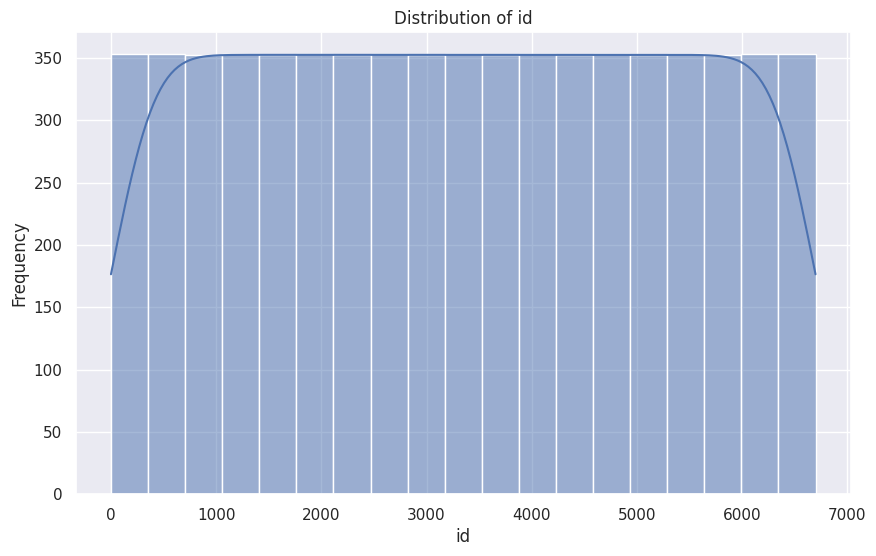

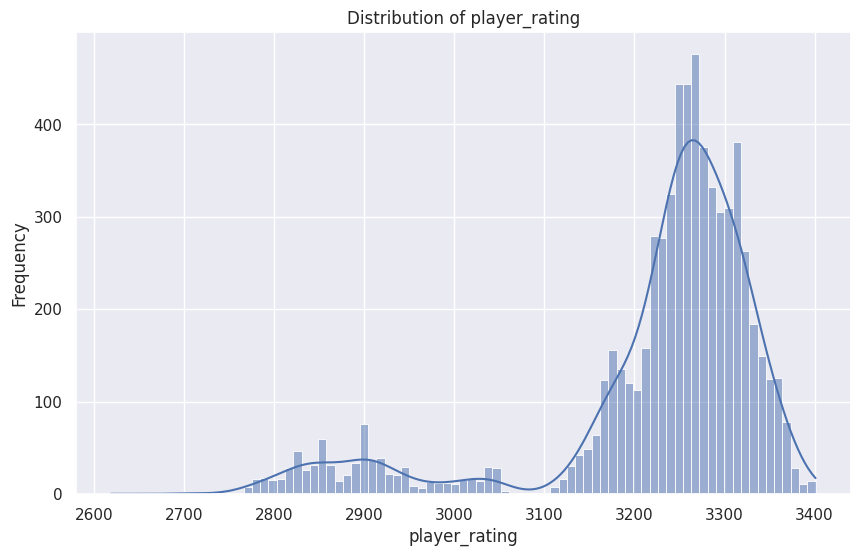

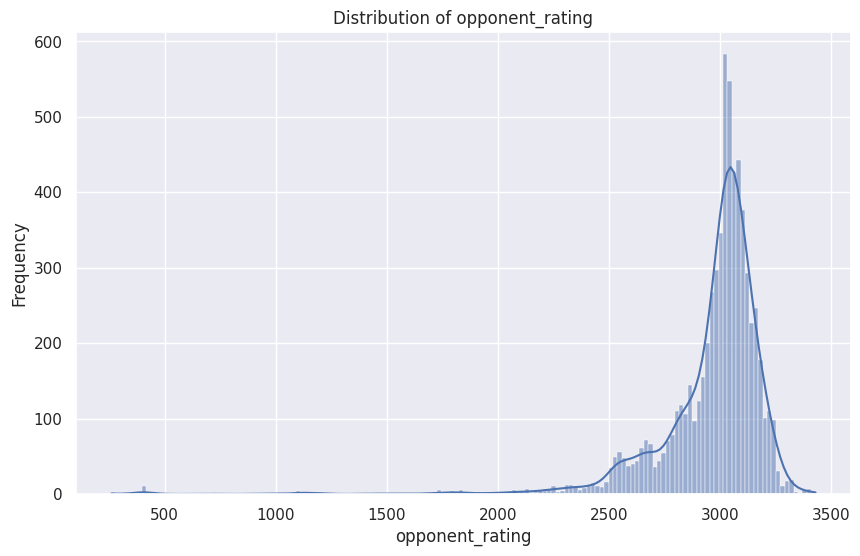

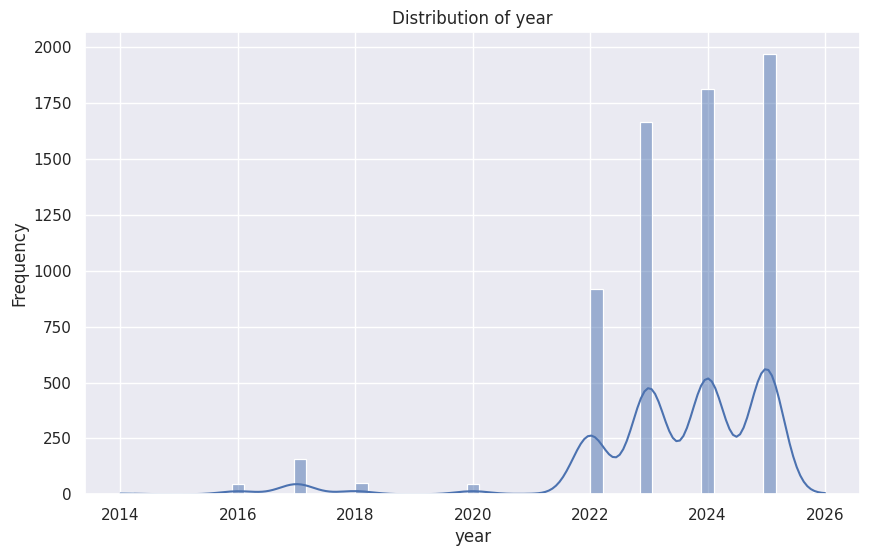

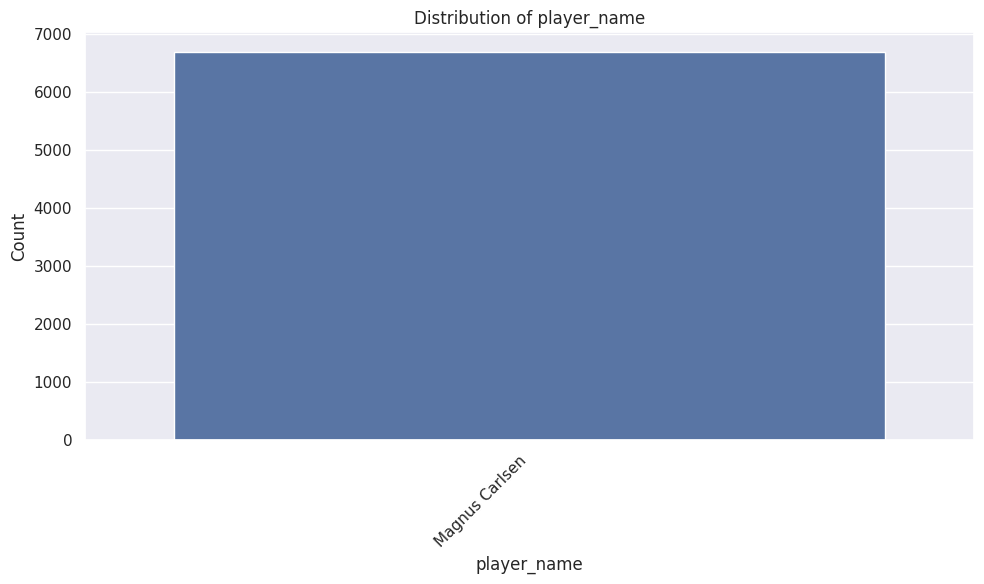

...

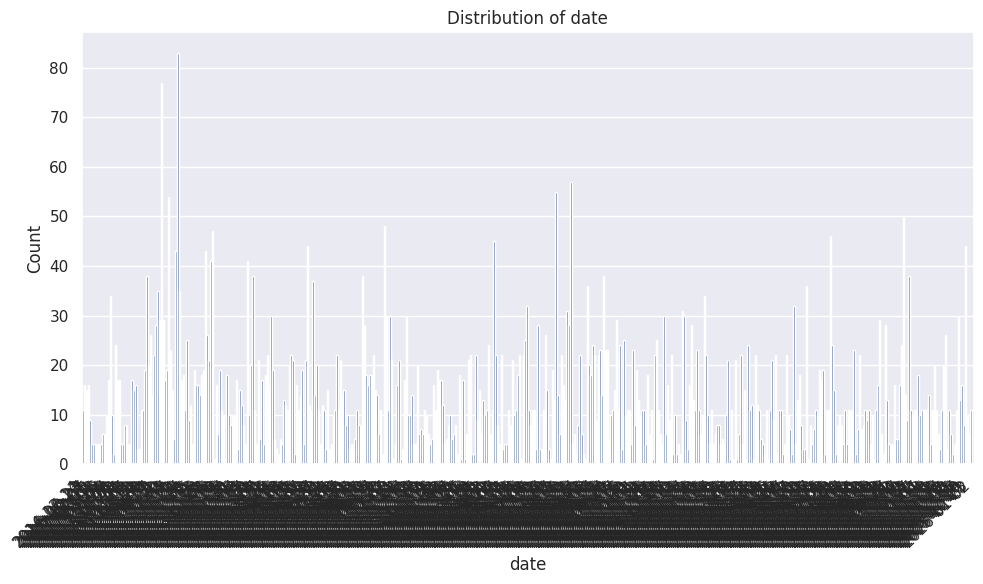

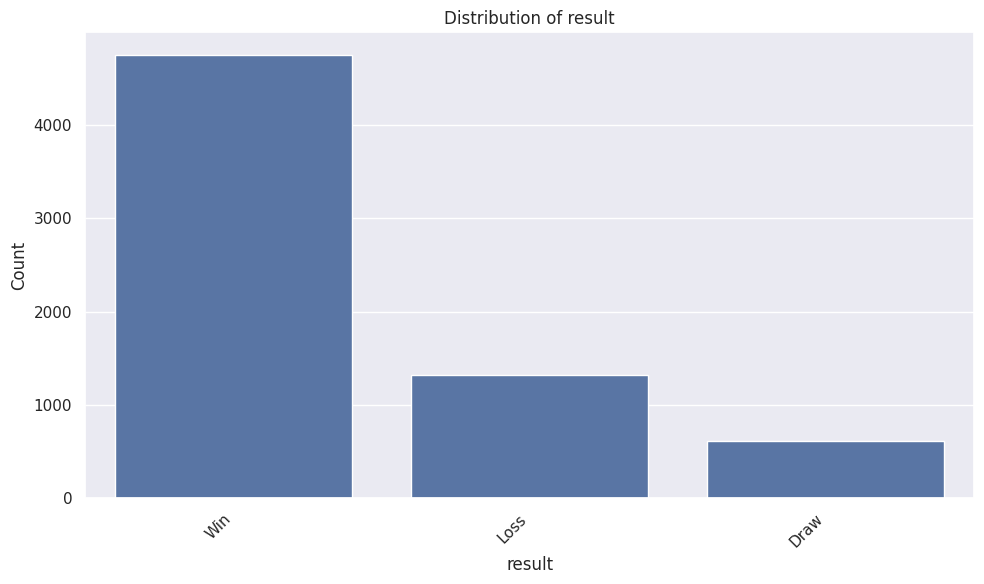

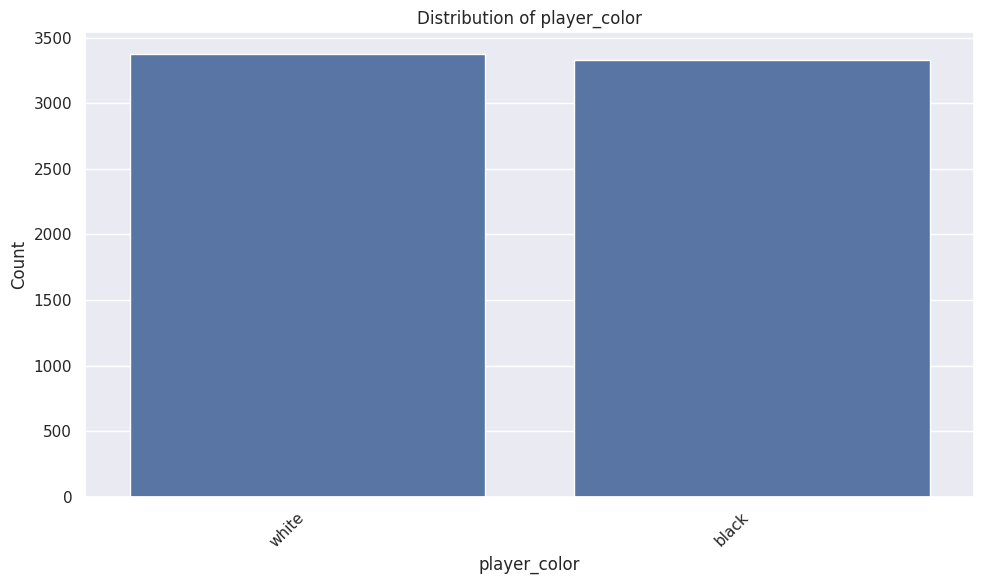

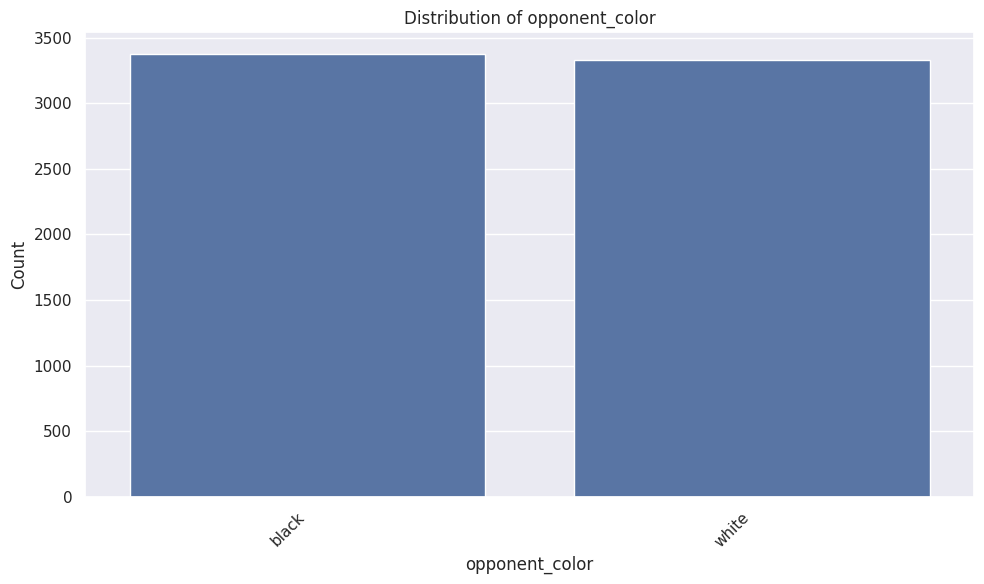

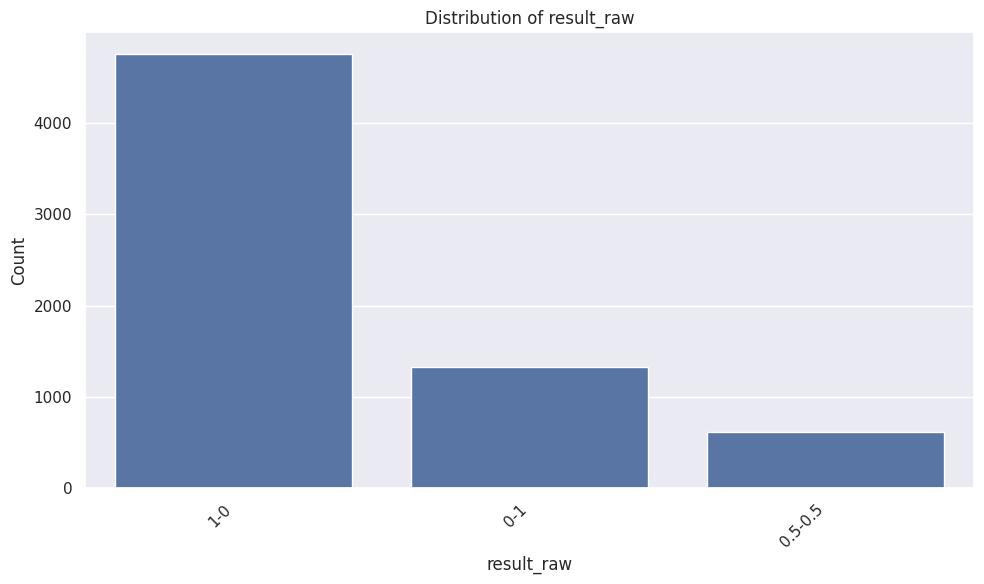

Value counts for player_name:
player_name
Magnus Carlsen    6699
Name: count, dtype: int64

Value counts for opponent_name:
opponent_name
DanielNaroditsky    412
NikoTheodorou       344
Njal28              212
mishanick           170
Hikaru              157
                   ... 
MikaKarttunen         1
superchess02          1
AccioChess            1
annasargsyan_m        1
honestgames           1
Name: count, Length: 945, dtype: int64

Value counts for format:
format
Blitz    6386
Rapid     313
Name: count, dtype: int64

Value counts for date:
date
2022-11-20    83
2022-10-12    77
2024-08-21    57
2024-08-07    55
2022-11-04    54
              ..
2023-01-25     1
2025-06-12     1
2025-09-15     1
2024-02-27     1
2024-02-21     1
Name: count, Length: 488, dtype: int64

Value counts for result:
result
Win     4756
Loss    1326
Draw     617
Name: count, dtype: int64

Value counts for player_color:
player_color
white    3371
black    3328
Name: count, dtype: int64

Value counts for op

In [12]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

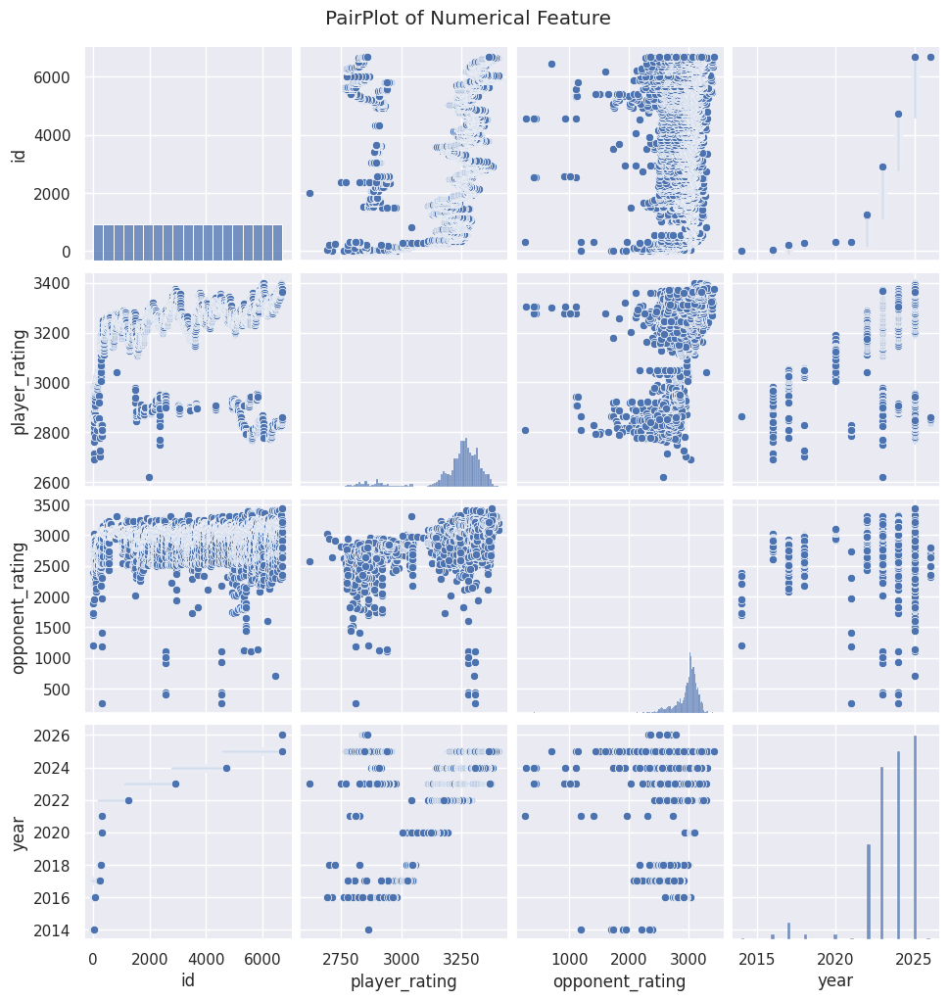

In [14]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('PairPlot of Numerical Feature', y=1.02)
plt.show()

In [16]:
df['date'] = pd.to_datetime(df['date'])

### Win/Loss/Draw Distribution by Game Format

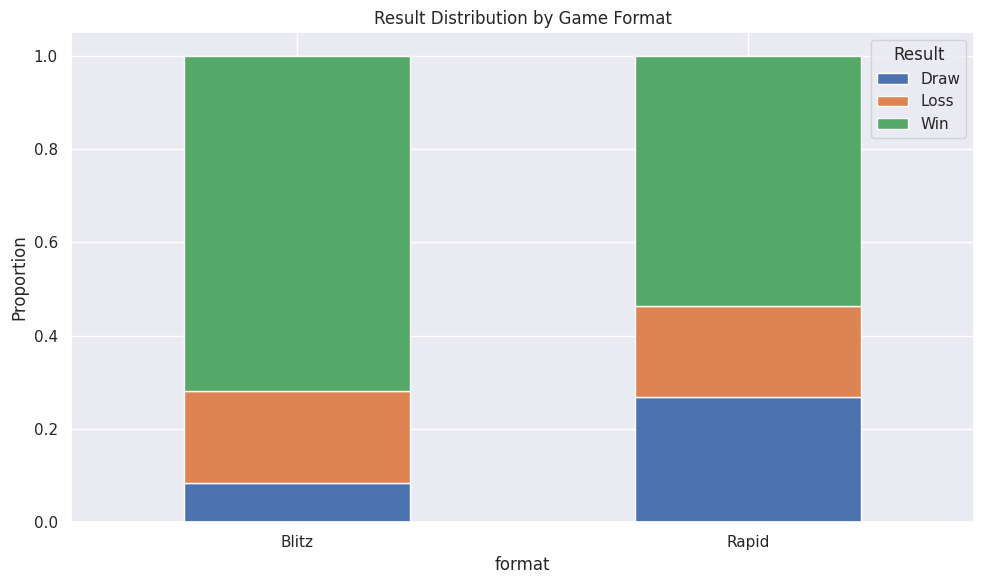

In [17]:
result_by_format = df.groupby('format')['result'].value_counts(normalize=True).unstack()
result_by_format.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Result Distribution by Game Format')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.legend(title='Result')
plt.tight_layout()
plt.show()

### Win/Loss/Draw Distribution by Player Color

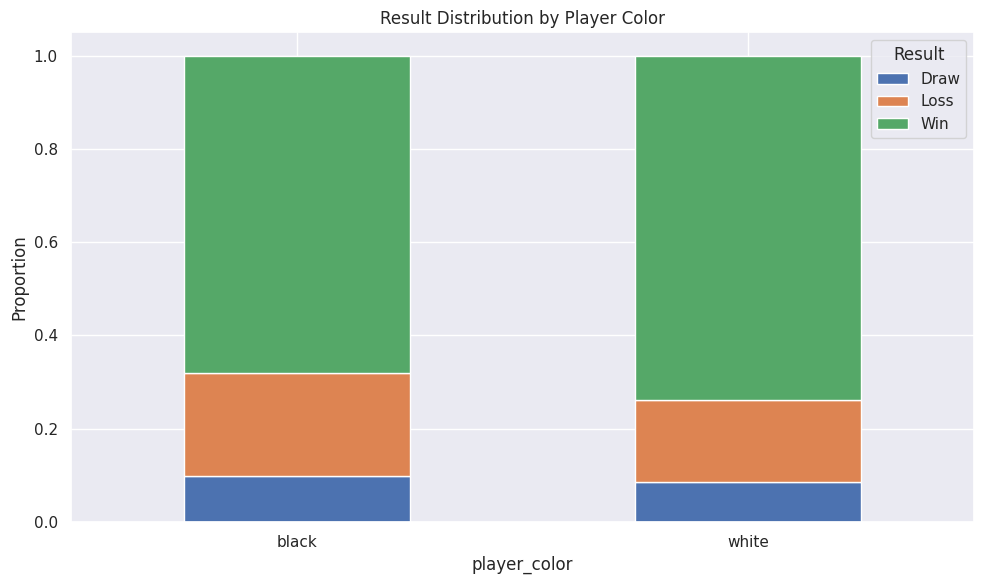

In [18]:
result_by_color = df.groupby('player_color')['result'].value_counts(normalize=True).unstack()
result_by_color.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Result Distribution by Player Color')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.legend(title='Result')
plt.tight_layout()
plt.show()

### Win Rate Trend Over Years

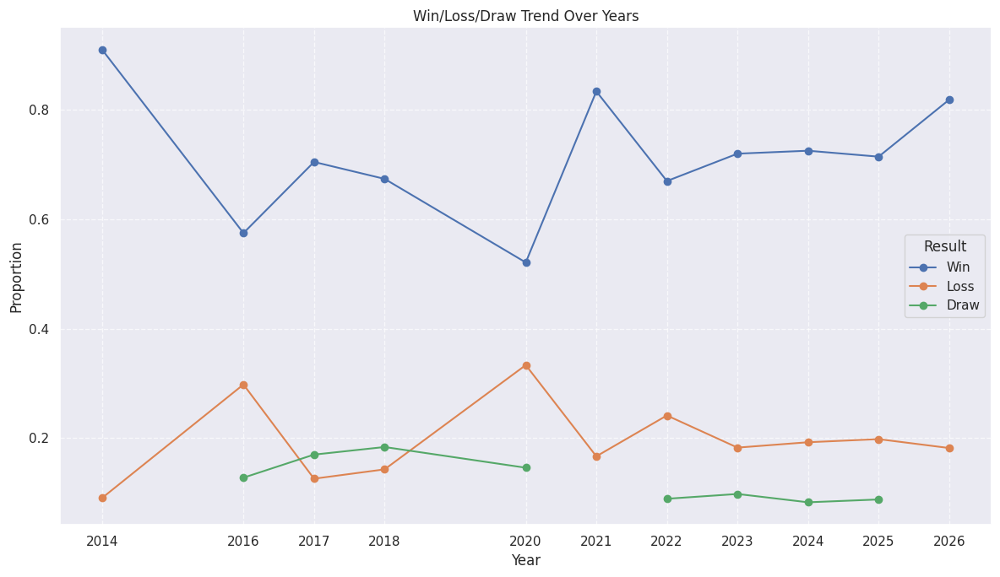

In [19]:
result_by_year = df.groupby('year')['result'].value_counts(normalize=True).unstack()
result_by_year[['Win', 'Loss', 'Draw']].plot(kind='line', marker='o', figsize=(12, 7))
plt.title('Win/Loss/Draw Trend Over Years')
plt.ylabel('Proportion')
plt.xlabel('Year')
plt.xticks(df['year'].unique().astype(int))
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Result')
plt.tight_layout()
plt.show()

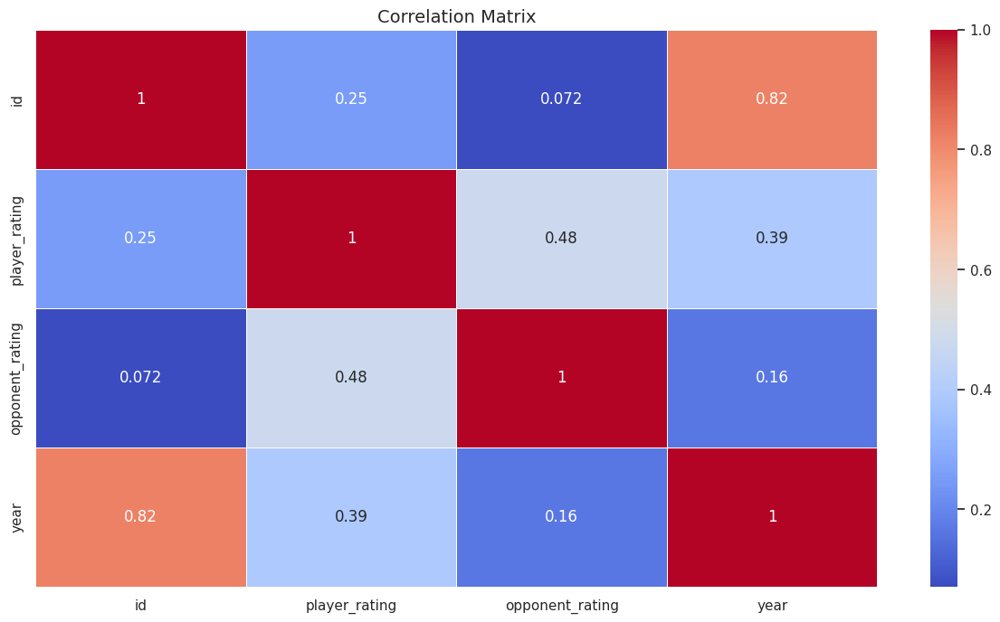

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You